<a href="https://colab.research.google.com/github/brockmanmatt/gdelt_news_exploration/blob/master/NeuralNetworks_add_search.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# OVERVIEW

Uses the last 6 months of GDELT V2 data to build neural network for forecasting news coverage!

In [1]:
# Here hook into the Google Drive, etc.
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
cd /content/gdrive/"My Drive"/[INSERT DIR HERE]

# DATA ACQUISITION

* Part 1: News Coverage
  * GDELT

* Part 2: Form time series
 * Hmm, I think having similar time series may improve but then adding random ones not seeing as much improvement; also only using a few months of data (because I really just care about integrating with the 3 month Google search) so that could limit

* Part 3: Train network
 * First does with Neural Network (fastai tabular)
 * Then does with decision trees (sklearn)

In [0]:
#get GDELT amd related files

In [0]:
#set this to True if you want to download the data
download_data = False

In [0]:
if download_data:
  !pip install gdelt
  import gdelt
  gd = gdelt.gdelt(version=2)

In [0]:
#This will download all days of GDELT v2 to a folder called data
#This will take ~2gb per day, or ~300gb total?

if download_data:
  import datetime
  cur_date = datetime.datetime(2019,5,1)
  end_date = datetime.datetime.today()-datetime.timedelta(days=2)

  import os
  os.makedirs("data", exist_ok=True)

  results = ""

  while cur_date < end_date:

    print("%s-%s-%s"%(cur_date.year, cur_date.month, cur_date.day))
    if not os.path.exists("data/%s-%s-%s.pkl"%(cur_date.year, cur_date.month, cur_date.day)):
      year = cur_date.year
      month = str(cur_date.month)
      day = str(cur_date.day)
      
      if cur_date.month < 10:
        month = "0"+month
      if cur_date.day < 10:
        day = "0"+day

      try:
        results = gd.Search(['%s %s %s'%(year, month, day)],table='gkg',coverage=True, translation=False)
        results.to_pickle("data/%s-%s-%s.pkl"%(cur_date.year, cur_date.month, cur_date.day))
      except:
        print("{} had an error".format(cur_date))

    cur_date+=datetime.timedelta(days=1)

In [0]:
#get Google search files

# Let's try with V2!

1.   List item
2.   List item



In [0]:
import os
import pandas as pd

In [0]:
load_files=False

In [0]:
if load_files:
  os.makedirs("smaller_data2", exist_ok=True)

  bad = ["wsj.com",
         "dailykos.com",
         "motherjones.com",
  ]

  potential_targets = ["washingtonpost.com", 
             "wsj.com", 
             "nytimes.com", 
             "foxnews.com", 
             "cnn.com", 
             "msnbc.com", 
             "reuters.com", 
             "breitbart.com", 
             "dailykos.com",
             "dailycaller.com",
             "dailywire.com",
             "dailysignal.com",
             "politico.com",
             "thehill.com",
             "motherjones.com",
             "nypost.com",
             ]

  targets = []
  for target in potential_targets:
    if target in bad:
      continue
    targets.append(target)


  potential_files = os.listdir("data")
  idx=0

  for daily_articles in potential_files:

    print (daily_articles)

    print ("{}/{}".format(idx,len(potential_files)))

    idx+=1

    if daily_articles in os.listdir("smaller_data2"):
      continue

    if not daily_articles.endswith(".pkl"):
      continue

    test_df = pd.read_pickle("data/"+daily_articles)


    test_df = test_df[test_df.SourceCommonName.isin(targets)]


    test_df.to_pickle("smaller_data2/" + daily_articles)

In [0]:
if load_files:
  df = pd.DataFrame()

  idx = 0
  for day in os.listdir("smaller_data2"):
    print(day)
    df = pd.concat([df, pd.read_pickle("smaller_data2/" + day)])

In [0]:
if load_files:
  df.DATE = df.DATE.apply(lambda x: str(int(x)))
  df.DATE = pd.to_datetime(df.DATE)

  import datetime
  df = df[df.DATE < datetime.datetime(2019,11,11)]
  df.fillna("", inplace=True)

  df.set_index("DATE", inplace=True, drop=True)


In [0]:
if load_files:
  df.to_pickle("6_months_df_extended_pubs.pkl")

In [0]:
if not load_files:
  df = pd.read_pickle("6_months_df_extended_pubs.pkl")

# back to um, 1D

In [15]:
len(df)

542869

In [16]:
df[df.V2Themes.apply(lambda x: x.lower().find("impeach") > -1)]["V2Themes"].head()

DATE
2019-08-01 00:00:00    ELECTION,194;TAX_FNCACT_EDITOR,24;TAX_POLITICA...
2019-08-01 00:15:00    USPEC_POLITICS_GENERAL1,66;EPU_POLICY_CONGRESS...
2019-08-01 00:30:00    TAX_FNCACT_CANDIDATES,960;EPU_POLICY_CONGRESSI...
2019-08-01 00:45:00    TAX_POLITICAL_PARTY_REPUBLICANS,3310;TAX_POLIT...
2019-08-01 02:15:00    KILL,443;WB_696_PUBLIC_SECTOR_MANAGEMENT,256;W...
Name: V2Themes, dtype: object

In [0]:
time_series = pd.DataFrame()

for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Locations.apply(lambda x: x.find("Ukraine") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Ukraine"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Locations.apply(lambda x: x.find("Russia") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Russia"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Locations.apply(lambda x: x.find("China") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_China"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.lower().find("impeach") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Impeachment"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.upper().find("TAX_POLITICAL_PARTY_REPUBLICANS") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Republicans"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.upper().find("TAX_POLITICAL_PARTY_DEMOCRATS") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Democrats"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.upper().find("IMMIGRATION") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Immigration"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.upper().find("DISCRIMINATION_RACE") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_RacialDiscrimination"})], axis=1)

In [0]:
for pub in df.SourceCommonName.unique():
  time_series = pd.concat([time_series, df[(df.SourceCommonName == pub) & (df.V2Themes.apply(lambda x: x.upper().find("EDUCATION") > -1))].resample("D").count()[["SourceCollectionIdentifier"]].rename(columns={"SourceCollectionIdentifier":pub + "_Education"})], axis=1)

In [0]:
time_series.fillna(0, inplace=True)
#time_series = time_series[time_series.index > datetime.datetime(2019,9,1)]

In [27]:
len(time_series)

194

In [28]:
time_series.head()

,reuters.com_Ukraine,cnn.com_Ukraine,washingtonpost.com_Ukraine,thehill.com_Ukraine,nypost.com_Ukraine,politico.com_Ukraine,dailywire.com_Ukraine,breitbart.com_Ukraine,nytimes.com_Ukraine,foxnews.com_Ukraine,msnbc.com_Ukraine,dailysignal.com_Ukraine,dailycaller.com_Ukraine,reuters.com_Russia,cnn.com_Russia,washingtonpost.com_Russia,thehill.com_Russia,nypost.com_Russia,politico.com_Russia,dailywire.com_Russia,breitbart.com_Russia,nytimes.com_Russia,foxnews.com_Russia,msnbc.com_Russia,dailysignal.com_Russia,dailycaller.com_Russia,reuters.com_China,cnn.com_China,washingtonpost.com_China,thehill.com_China,nypost.com_China,politico.com_China,dailywire.com_China,breitbart.com_China,nytimes.com_China,foxnews.com_China,msnbc.com_China,dailysignal.com_China,dailycaller.com_China,reuters.com_Impeachment,...,dailycaller.com_Democrats,reuters.com_Immigration,cnn.com_Immigration,washingtonpost.com_Immigration,thehill.com_Immigration,nypost.com_Immigration,politico.com_Immigration,dailywire.com_Immigration,breitbart.com_Immigration,nytimes.com_Immigration,foxnews.com_Immigration,msnbc.com_Immigration,dailysignal.com_Immigration,dailycaller.com_Immigration,reuters.com_RacialDiscrimination,cnn.com_RacialDiscrimination,washingtonpost.com_RacialDiscrimination,thehill.com_RacialDiscrimination,nypost.com_RacialDiscrimination,politico.com_RacialDiscrimination,dailywire.com_RacialDiscrimination,breitbart.com_RacialDiscrimination,nytimes.com_RacialDiscrimination,foxnews.com_RacialDiscrimination,msnbc.com_RacialDiscrimination,dailysignal.com_RacialDiscrimination,dailycaller.com_RacialDiscrimination,reuters.com_Education,cnn.com_Education,washingtonpost.com_Education,thehill.com_Education,nypost.com_Education,politico.com_Education,dailywire.com_Education,breitbart.com_Education,nytimes.com_Education,foxnews.com_Education,msnbc.com_Education,dailysignal.com_Education,dailycaller.com_Education
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-05-01,16,1,4,4,0.0,1,0.0,2,1,3,0.0,0.0,0.0,164,29,59,62,5,20,1.0,21,25,48,5.0,0.0,7,275,20,25,13,5,8,0.0,11,16,11,0.0,0.0,0.0,29,...,7,47,4,21,16,1,9,0.0,10,15,11,2.0,1.0,1.0,0.0,3,11,6,3,4.0,1.0,3,5,1.0,0.0,2.0,0.0,306,40,147,59,35,20,2.0,28,86,72,3,5,6.0
2019-05-02,39,2,8,0,0.0,1,0.0,2,6,2,0.0,2.0,2.0,213,17,62,34,12,16,1.0,19,27,43,7.0,6.0,15,295,17,43,7,4,14,0.0,9,25,16,0.0,2.0,4.0,18,...,7,22,6,24,12,3,10,0.0,10,19,15,0.0,3.0,5.0,4.0,2,9,3,1,1.0,0.0,3,2,3.0,0.0,1.0,0.0,305,51,138,36,39,25,1.0,23,86,81,1,6,9.0
2019-05-03,22,0,4,3,1.0,2,0.0,1,2,8,0.0,0.0,1.0,161,11,51,23,7,10,0.0,12,15,43,6.0,3.0,3,259,11,37,6,7,9,0.0,10,12,13,1.0,0.0,5.0,6,...,3,50,5,19,16,4,4,0.0,6,11,10,1.0,0.0,0.0,1.0,3,14,3,1,0.0,0.0,9,5,3.0,0.0,0.0,0.0,349,37,165,30,28,35,0.0,32,69,56,8,2,7.0
2019-05-04,3,2,1,0,1.0,0,0.0,1,1,1,0.0,0.0,1.0,51,9,20,15,6,3,0.0,11,13,15,8.0,0.0,2,42,6,7,0,1,1,0.0,12,10,4,0.0,0.0,0.0,0,...,1,8,0,13,5,0,1,0.0,9,6,4,0.0,1.0,0.0,8.0,2,7,2,1,0.0,0.0,4,3,2.0,0.0,0.0,1.0,68,17,65,17,15,3,1.0,17,36,38,2,0,4.0
2019-05-05,4,0,2,2,0.0,0,0.0,1,0,0,0.0,0.0,0.0,38,15,23,17,8,6,0.0,7,7,15,13.0,1.0,1,58,4,14,5,3,2,0.0,4,5,6,0.0,0.0,0.0,0,...,6,18,3,9,6,3,4,0.0,2,5,2,0.0,0.0,1.0,1.0,0,5,1,1,0.0,0.0,3,5,0.0,2.0,0.0,0.0,98,15,61,26,15,10,0.0,11,33,32,0,1,3.0


In [0]:
# goog = pd.read_pickle("GoogleData/impeachment_ukraine.pkl")

In [0]:
# time_series = pd.concat([time_series,goog[["impeachment", "ukraine"]].add_prefix("search_")], axis=1).dropna()

In [31]:
time_series.head()

,reuters.com_Ukraine,cnn.com_Ukraine,washingtonpost.com_Ukraine,thehill.com_Ukraine,nypost.com_Ukraine,politico.com_Ukraine,dailywire.com_Ukraine,breitbart.com_Ukraine,nytimes.com_Ukraine,foxnews.com_Ukraine,msnbc.com_Ukraine,dailysignal.com_Ukraine,dailycaller.com_Ukraine,reuters.com_Russia,cnn.com_Russia,washingtonpost.com_Russia,thehill.com_Russia,nypost.com_Russia,politico.com_Russia,dailywire.com_Russia,breitbart.com_Russia,nytimes.com_Russia,foxnews.com_Russia,msnbc.com_Russia,dailysignal.com_Russia,dailycaller.com_Russia,reuters.com_China,cnn.com_China,washingtonpost.com_China,thehill.com_China,nypost.com_China,politico.com_China,dailywire.com_China,breitbart.com_China,nytimes.com_China,foxnews.com_China,msnbc.com_China,dailysignal.com_China,dailycaller.com_China,reuters.com_Impeachment,...,dailycaller.com_Democrats,reuters.com_Immigration,cnn.com_Immigration,washingtonpost.com_Immigration,thehill.com_Immigration,nypost.com_Immigration,politico.com_Immigration,dailywire.com_Immigration,breitbart.com_Immigration,nytimes.com_Immigration,foxnews.com_Immigration,msnbc.com_Immigration,dailysignal.com_Immigration,dailycaller.com_Immigration,reuters.com_RacialDiscrimination,cnn.com_RacialDiscrimination,washingtonpost.com_RacialDiscrimination,thehill.com_RacialDiscrimination,nypost.com_RacialDiscrimination,politico.com_RacialDiscrimination,dailywire.com_RacialDiscrimination,breitbart.com_RacialDiscrimination,nytimes.com_RacialDiscrimination,foxnews.com_RacialDiscrimination,msnbc.com_RacialDiscrimination,dailysignal.com_RacialDiscrimination,dailycaller.com_RacialDiscrimination,reuters.com_Education,cnn.com_Education,washingtonpost.com_Education,thehill.com_Education,nypost.com_Education,politico.com_Education,dailywire.com_Education,breitbart.com_Education,nytimes.com_Education,foxnews.com_Education,msnbc.com_Education,dailysignal.com_Education,dailycaller.com_Education
DATE,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-05-01,16,1,4,4,0.0,1,0.0,2,1,3,0.0,0.0,0.0,164,29,59,62,5,20,1.0,21,25,48,5.0,0.0,7,275,20,25,13,5,8,0.0,11,16,11,0.0,0.0,0.0,29,...,7,47,4,21,16,1,9,0.0,10,15,11,2.0,1.0,1.0,0.0,3,11,6,3,4.0,1.0,3,5,1.0,0.0,2.0,0.0,306,40,147,59,35,20,2.0,28,86,72,3,5,6.0
2019-05-02,39,2,8,0,0.0,1,0.0,2,6,2,0.0,2.0,2.0,213,17,62,34,12,16,1.0,19,27,43,7.0,6.0,15,295,17,43,7,4,14,0.0,9,25,16,0.0,2.0,4.0,18,...,7,22,6,24,12,3,10,0.0,10,19,15,0.0,3.0,5.0,4.0,2,9,3,1,1.0,0.0,3,2,3.0,0.0,1.0,0.0,305,51,138,36,39,25,1.0,23,86,81,1,6,9.0
2019-05-03,22,0,4,3,1.0,2,0.0,1,2,8,0.0,0.0,1.0,161,11,51,23,7,10,0.0,12,15,43,6.0,3.0,3,259,11,37,6,7,9,0.0,10,12,13,1.0,0.0,5.0,6,...,3,50,5,19,16,4,4,0.0,6,11,10,1.0,0.0,0.0,1.0,3,14,3,1,0.0,0.0,9,5,3.0,0.0,0.0,0.0,349,37,165,30,28,35,0.0,32,69,56,8,2,7.0
2019-05-04,3,2,1,0,1.0,0,0.0,1,1,1,0.0,0.0,1.0,51,9,20,15,6,3,0.0,11,13,15,8.0,0.0,2,42,6,7,0,1,1,0.0,12,10,4,0.0,0.0,0.0,0,...,1,8,0,13,5,0,1,0.0,9,6,4,0.0,1.0,0.0,8.0,2,7,2,1,0.0,0.0,4,3,2.0,0.0,0.0,1.0,68,17,65,17,15,3,1.0,17,36,38,2,0,4.0
2019-05-05,4,0,2,2,0.0,0,0.0,1,0,0,0.0,0.0,0.0,38,15,23,17,8,6,0.0,7,7,15,13.0,1.0,1,58,4,14,5,3,2,0.0,4,5,6,0.0,0.0,0.0,0,...,6,18,3,9,6,3,4,0.0,2,5,2,0.0,0.0,1.0,1.0,0,5,1,1,0.0,0.0,3,5,0.0,2.0,0.0,0.0,98,15,61,26,15,10,0.0,11,33,32,0,1,3.0


In [0]:
test_cov = pd.DataFrame()

test_cov = pd.concat([time_series.shift(x).add_suffix("_{}".format(x)) for x in range(1,7)], axis=1)

for issue in time_series.columns:
  for ma in range(1,7):
    test_cov["{}_sma{}".format(issue, ma)] = time_series[[issue]].rolling(window=ma).mean().shift()

for day in range(7):
  test_cov["d{}".format(day)] = test_cov.index.map(lambda x: 1 if x.weekday()==day else 0)

test_cov = test_cov[7:]

In [33]:
len(test_cov.columns)

1411

In [0]:
testing = time_series.join(test_cov).dropna()

In [0]:
testing["date"] = testing.index

So here's what I want:
instead of a bunch of time series together, take each column and stick as new;
so basically, 

In [0]:
preprocessed_data = testing.melt(id_vars = list(test_cov.columns) + ["date"],
    var_name="Topic", 
        value_name="Articles")

In [0]:
#preprocessed_data["publisher"] = preprocessed_data["Topic"].apply(lambda x: x.split("_")[0])

In [0]:
#convert to unix time

In [0]:
import time
preprocessed_data["date"] = preprocessed_data["date"].apply(lambda t: time.mktime(t.timetuple()))

In [0]:
from fastai.tabular import *

In [0]:
os.makedirs("tabular", exist_ok=True)

In [0]:
preprocessed_data.sort_values(by="date", ascending=True,inplace=True)

In [0]:
pub_dict = {}
topic_dict = {}
for x in time_series.columns:
  y = x.split("_")
  try:
    pub_dict[y[0]] += 1
  except:
    pub_dict[y[0]] =1

  try:
    topic_dict[y[1]] += 1
  except:
    topic_dict[y[1]] =1


In [47]:
len(topic_dict)

9

In [0]:
validation_days = 21
test_days = 7

In [0]:
validation_length = len(pub_dict) * len(topic_dict)*validation_days
test_length = len(pub_dict) * len(topic_dict) * test_days

In [0]:
preprocessed_data["publication"] = preprocessed_data["Topic"].apply(lambda x: x.split("_")[0])
preprocessed_data["theme"] = preprocessed_data["Topic"].apply(lambda x: x.split("_")[1])

In [0]:
preprocessed_data = preprocessed_data[[x for x in preprocessed_data.columns if x!="Articles"]+["Articles"]]

In [0]:
# Tabular templated from https://nbviewer.jupyter.org/github/fastai/course-v3/blob/master/nbs/dl1/lesson4-tabular.ipynb

In [0]:
preprocessed_data.reset_index(inplace=True,drop=True)

In [64]:
preprocessed_data.head()

,reuters.com_Ukraine_1,cnn.com_Ukraine_1,washingtonpost.com_Ukraine_1,thehill.com_Ukraine_1,nypost.com_Ukraine_1,politico.com_Ukraine_1,dailywire.com_Ukraine_1,breitbart.com_Ukraine_1,nytimes.com_Ukraine_1,foxnews.com_Ukraine_1,msnbc.com_Ukraine_1,dailysignal.com_Ukraine_1,dailycaller.com_Ukraine_1,reuters.com_Russia_1,cnn.com_Russia_1,washingtonpost.com_Russia_1,thehill.com_Russia_1,nypost.com_Russia_1,politico.com_Russia_1,dailywire.com_Russia_1,breitbart.com_Russia_1,nytimes.com_Russia_1,foxnews.com_Russia_1,msnbc.com_Russia_1,dailysignal.com_Russia_1,dailycaller.com_Russia_1,reuters.com_China_1,cnn.com_China_1,washingtonpost.com_China_1,thehill.com_China_1,nypost.com_China_1,politico.com_China_1,dailywire.com_China_1,breitbart.com_China_1,nytimes.com_China_1,foxnews.com_China_1,msnbc.com_China_1,dailysignal.com_China_1,dailycaller.com_China_1,reuters.com_Impeachment_1,...,nytimes.com_Education_sma3,nytimes.com_Education_sma4,nytimes.com_Education_sma5,nytimes.com_Education_sma6,foxnews.com_Education_sma1,foxnews.com_Education_sma2,foxnews.com_Education_sma3,foxnews.com_Education_sma4,foxnews.com_Education_sma5,foxnews.com_Education_sma6,msnbc.com_Education_sma1,msnbc.com_Education_sma2,msnbc.com_Education_sma3,msnbc.com_Education_sma4,msnbc.com_Education_sma5,msnbc.com_Education_sma6,dailysignal.com_Education_sma1,dailysignal.com_Education_sma2,dailysignal.com_Education_sma3,dailysignal.com_Education_sma4,dailysignal.com_Education_sma5,dailysignal.com_Education_sma6,dailycaller.com_Education_sma1,dailycaller.com_Education_sma2,dailycaller.com_Education_sma3,dailycaller.com_Education_sma4,dailycaller.com_Education_sma5,dailycaller.com_Education_sma6,d0,d1,d2,d3,d4,d5,d6,date,Topic,publication,theme,Articles
0,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,reuters.com_Ukraine,reuters.com,Ukraine,13.0
1,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailycaller.com_Republicans,dailycaller.com,Republicans,2.0
2,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailycaller.com_Impeachment,dailycaller.com,Impeachment,1.0
3,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,breitbart.com_Impeachment,breitbart.com,Impeachment,6.0
4,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailywire.com_Democrats,dailywire.com,Democrats,0.0


In [0]:
# dep_var = 'Articles'
# cat_names = ['Topic'] + [x for x in preprocessed_data.columns if (len(x) < 4)]
# cont_names = [x for x in preprocessed_data.columns if x not in ["Articles"]+cat_names]
# procs = [Categorify, Normalize]

# os.makedirs("tabular", exist_ok=True)
# path = "tabular"

# test = TabularList.from_df(preprocessed_data[-test_length:].copy(), path=path, cat_names=cat_names, cont_names=cont_names)

# shuffled = preprocessed_data[:-test_length].sample(frac=1).reset_index(drop=True).copy()

In [0]:
# data = (TabularList.from_df(shuffled, path=path, cat_names=cat_names, cont_names=cont_names, procs=procs)
#                            .split_by_idx(list(range(len(shuffled)-validation_length, len(shuffled))))
#                            .label_from_df()
#                            .add_test(test)
#                            .databunch())

In [0]:
dep_var = 'Articles'
cat_names = ['Topic'] + [x for x in preprocessed_data.columns if (len(x) < 12)]
cont_names = [x for x in preprocessed_data.columns if x not in ["Articles"] + cat_names]
procs = [Categorify, Normalize]

os.makedirs("tabular", exist_ok=True)
path = "tabular"

test = TabularList.from_df(preprocessed_data[-test_length:].copy(), path=path, cat_names=cat_names, cont_names=cont_names)


In [0]:
validation_start = len(preprocessed_data) - test_length - validation_length

In [0]:
data = (TabularList.from_df(preprocessed_data[:-test_length], path=path, cat_names=cat_names, cont_names=cont_names, procs=procs)
                           .split_by_idx(range(validation_start, validation_start + validation_length))
                           .label_from_df(cols=dep_var)
                           .add_test(test)
                           .databunch())

In [0]:
# learn = tabular_learner(data, layers=[len(time_series.columns)*6,len(time_series.columns)*4, len(time_series.columns)*3, len(time_series.columns)*2, len(time_series.columns)], emb_drop=.0, ps=[ .05, .05, .15, .1, 0], metrics=accuracy)

In [0]:
learn = tabular_learner(data, layers=[len(time_series.columns)*9, len(time_series.columns)*5, len(time_series.columns)*3, len(time_series.columns)], emb_drop=.0, ps=[ .1, .1, .05, 0], metrics=accuracy)

In [72]:
learn.fit(10)


epoch,train_loss,valid_loss,accuracy,time
0,567.556274,223.744995,0.162800,00:04
1,565.717590,266.038177,0.162800,00:04
2,498.910736,287.506989,0.162800,00:04
3,285.976227,308.897125,0.162800,00:04
4,185.162582,329.865570,0.162800,00:04
5,188.393661,315.186005,0.162800,00:04
6,214.465439,263.225464,0.162800,00:04
7,119.039902,247.141617,0.162800,00:04
8,118.723053,191.521133,0.162800,00:04
9,121.893501,190.612198,0.162800,00:04


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


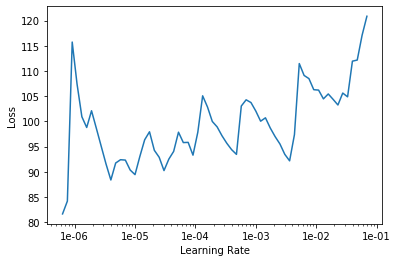

In [73]:
learn.lr_find()
learn.recorder.plot()

In [74]:
learn.fit_one_cycle(4, 3e-3)

epoch,train_loss,valid_loss,accuracy,time
0,84.017288,787.094177,0.162800,00:04
1,116.562767,220.770172,0.162800,00:04
2,74.678337,181.530746,0.162800,00:04
3,57.974537,192.642395,0.162800,00:04


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


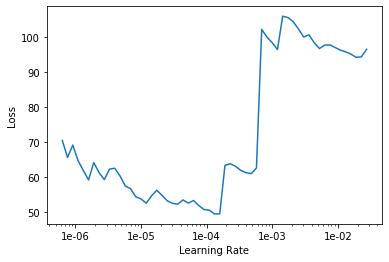

In [75]:
learn.lr_find()
learn.recorder.plot()

In [76]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,54.087345,206.237686,0.162800,00:04
1,63.590599,1649.741943,0.162800,00:04
2,54.939243,201.193588,0.162800,00:04


In [0]:
#oops, it bounced out again. whatever. this is just to demo. That's not supposed to be 20

In [0]:
learn.freeze_to(3)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


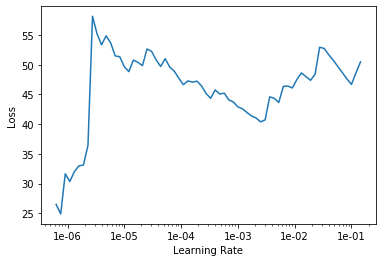

In [79]:
learn.lr_find()
learn.recorder.plot()

In [80]:
learn.fit_one_cycle(1, 1e-6)

epoch,train_loss,valid_loss,accuracy,time
0,62.494247,474.271942,0.162800,00:03


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


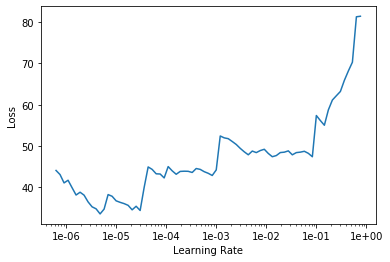

In [81]:
learn.lr_find()
learn.recorder.plot()

In [82]:
learn.fit_one_cycle(3, max_lr=(9e-7))

epoch,train_loss,valid_loss,accuracy,time
0,51.011204,207.400787,0.162800,00:03
1,73.784462,568.830505,0.162800,00:03
2,47.648052,188.548187,0.162800,00:03


In [0]:
learn.freeze_to(4)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


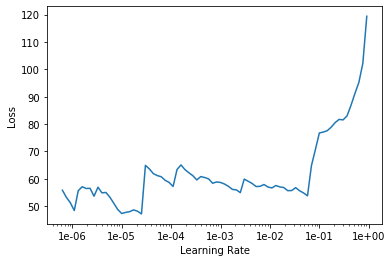

In [84]:
learn.lr_find()
learn.recorder.plot()

In [85]:
learn.fit_one_cycle(2, 5e-5)

epoch,train_loss,valid_loss,accuracy,time
0,73.031685,208.486954,0.162800,00:03
1,42.459869,291.623627,0.162800,00:03


In [0]:
#it's going the wrong way! oh, I can't read

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


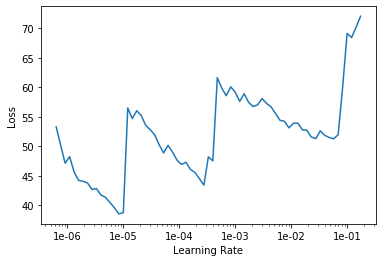

In [87]:
learn.lr_find()
learn.recorder.plot()

In [88]:
learn.fit_one_cycle(1, 1.5e-4)

epoch,train_loss,valid_loss,accuracy,time
0,50.203949,248.493668,0.162800,00:03


In [0]:
#good enough

In [90]:
learn.model

TabularModel(
  (embeds): ModuleList(
    (0): Embedding(118, 23)
    (1): Embedding(3, 3)
    (2): Embedding(3, 3)
    (3): Embedding(3, 3)
    (4): Embedding(3, 3)
    (5): Embedding(3, 3)
    (6): Embedding(3, 3)
    (7): Embedding(3, 3)
    (8): Embedding(160, 27)
    (9): Embedding(118, 23)
    (10): Embedding(14, 7)
    (11): Embedding(10, 6)
    (12): Embedding(333, 41)
  )
  (emb_drop): Dropout(p=0.0, inplace=False)
  (bn_cont): BatchNorm1d(1404, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layers): Sequential(
    (0): Linear(in_features=1552, out_features=1053, bias=True)
    (1): ReLU(inplace=True)
    (2): BatchNorm1d(1053, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Dropout(p=0.1, inplace=False)
    (4): Linear(in_features=1053, out_features=585, bias=True)
    (5): ReLU(inplace=True)
    (6): BatchNorm1d(585, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): Dropout(p=0.1, inplace=False)
    (8): Li

In [0]:
predictions_Train, *_ = learn.get_preds(ds_type=DatasetType.Fix)
predictions_Valid, *_ = learn.get_preds(DatasetType.Valid)
predictions_Test, *_ = learn.get_preds(DatasetType.Test)

In [92]:
print(len(predictions_Train), len(predictions_Valid), len(predictions_Test))

18603 2457 819


In [0]:
#len(predictions_Train) + len(predictions_Valid)

In [0]:
all_preds = ([x[0].item() for x in predictions_Train] + [x[0].item() for x in predictions_Valid] + [x[0].item() for x in predictions_Test])

In [0]:
a = preprocessed_data[:-test_length][["date","Topic", "Articles"]].copy()

In [0]:
b = preprocessed_data[["date","Topic", "Articles"]][-test_length:].copy()

In [0]:
r = pd.concat([a,b])

In [0]:
r["p"] = all_preds

In [0]:
r.date = pd.to_datetime(r['date'],unit='s')

In [0]:
r.set_index("date", inplace=True, drop=True)

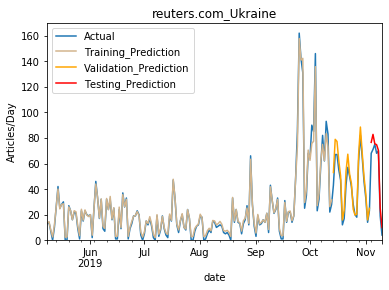

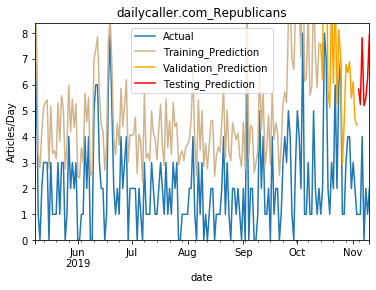

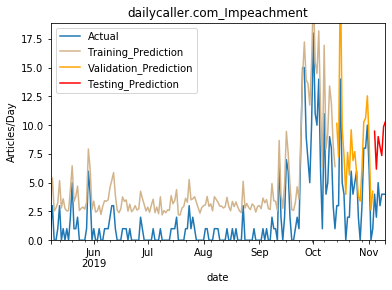

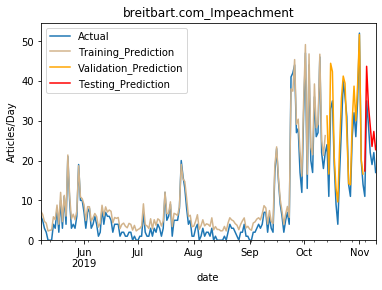

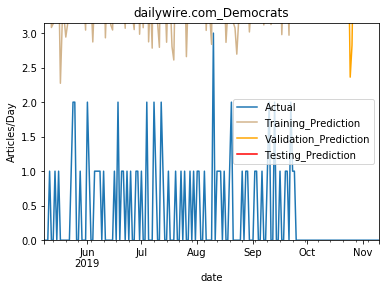

...

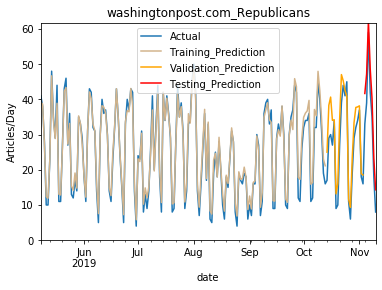

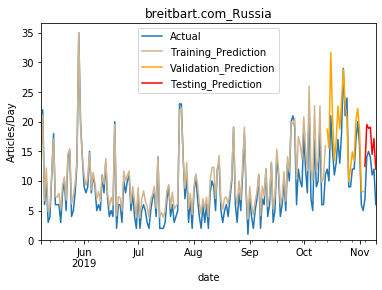

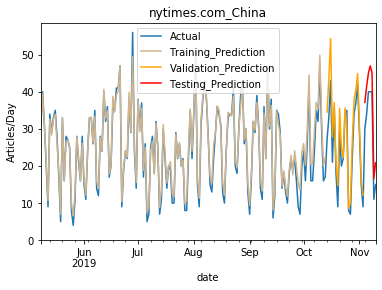

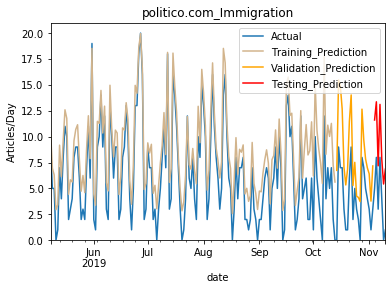

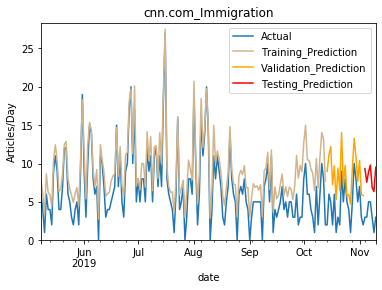

In [101]:
os.makedirs("imgs_6mo", exist_ok=True)
idx = 0
for topic in r.Topic.unique():
  ax = r[r.Topic==topic]["Articles"].plot(title="Topic: {}".format(topic), ylim=0, label="Actual")

  r[r.Topic==topic]["p"][:-(validation_days + test_days)].plot(title="{}".format(topic), ax=ax, ylim=0, color="tan", label="Training_Prediction")
  r[r.Topic==topic]["p"][-(validation_days + test_days):-test_days].plot(title="{}".format(topic), ax=ax, ylim=0, color="orange", label="Validation_Prediction")
  r[r.Topic==topic]["p"][-test_days:].plot(title="{}".format(topic), ax=ax, ylim=0, color="red", label="Testing_Prediction")
  
  idx +=1

  ax.set_ylabel("Articles/Day")

  ax.legend()
  #save images; you probably don't want to
  if True:
    plt.savefig('imgs_6mo/{}.png'.format(topic.replace(".", "_")), bbox_inches='tight')
  plt.show()


Text(0.5, 1.02, 'Neural Network Predictions by Day')

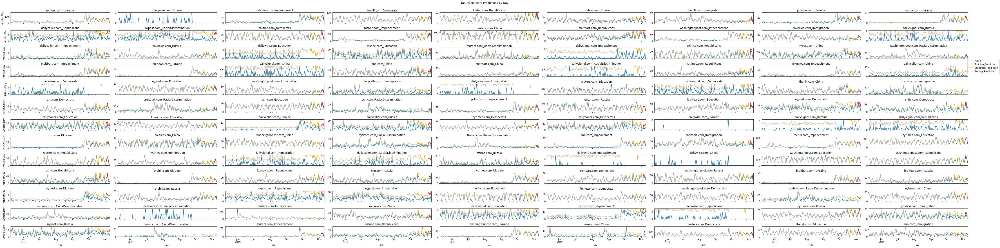

In [102]:
fig, axs = plt.subplots(len(pub_dict), int(len(r.Topic.unique())/len(pub_dict)), figsize=(60,15), sharex=True, facecolor="white")
x = y = 0

for topic in r.Topic.unique():
  r[r.Topic==topic]["Articles"].plot(title="{}".format(topic), ax=axs[x,y], ylim=0, label="Actual")

  r[r.Topic==topic]["p"][:-(validation_days + test_days)].plot(title="{}".format(topic), ax=axs[x,y], ylim=0, color="tan", label="Training_Prediction")
  r[r.Topic==topic]["p"][-(validation_days + test_days):-test_days].plot(title="{}".format(topic), ax=axs[x,y], ylim=0, color="orange", label="Validation_Prediction")
  r[r.Topic==topic]["p"][-test_days:].plot(title="{}".format(topic), ax=axs[x,y], ylim=0, color="red", label="Testing_Prediction")

  axs[x,y].legend()

  if x == 0 and y==0:
    handles, labels = axs[0,0].get_legend_handles_labels()

  axs[x,y].get_legend().remove()

  if y==0:
    axs[x,y].set_ylabel("Articles/Day")

  x+=1
  if x > len(pub_dict)-1:
    x =0
    y+=1


fig.legend(handles, labels, loc='center right',bbox_to_anchor=(1.03,.75))
fig.tight_layout()

fig.suptitle("Neural Network Predictions by Day", y=1.02)

# I don't really plan on updating this much; just doing it for a demonstration. Although it's cool that it works. Hmm, so I broke it. Ooops!

# So here's how to do the same thing with decision trees; you may notice the trees WAAAAY overfit

In [0]:
dt_data = preprocessed_data.copy()

In [0]:
cat = ["Topic", "publication", "theme"]

In [56]:
preprocessed_data.head()

,reuters.com_Ukraine_1,cnn.com_Ukraine_1,washingtonpost.com_Ukraine_1,thehill.com_Ukraine_1,nypost.com_Ukraine_1,politico.com_Ukraine_1,dailywire.com_Ukraine_1,breitbart.com_Ukraine_1,nytimes.com_Ukraine_1,foxnews.com_Ukraine_1,msnbc.com_Ukraine_1,dailysignal.com_Ukraine_1,dailycaller.com_Ukraine_1,reuters.com_Russia_1,cnn.com_Russia_1,washingtonpost.com_Russia_1,thehill.com_Russia_1,nypost.com_Russia_1,politico.com_Russia_1,dailywire.com_Russia_1,breitbart.com_Russia_1,nytimes.com_Russia_1,foxnews.com_Russia_1,msnbc.com_Russia_1,dailysignal.com_Russia_1,dailycaller.com_Russia_1,reuters.com_China_1,cnn.com_China_1,washingtonpost.com_China_1,thehill.com_China_1,nypost.com_China_1,politico.com_China_1,dailywire.com_China_1,breitbart.com_China_1,nytimes.com_China_1,foxnews.com_China_1,msnbc.com_China_1,dailysignal.com_China_1,dailycaller.com_China_1,reuters.com_Impeachment_1,...,nytimes.com_Education_sma3,nytimes.com_Education_sma4,nytimes.com_Education_sma5,nytimes.com_Education_sma6,foxnews.com_Education_sma1,foxnews.com_Education_sma2,foxnews.com_Education_sma3,foxnews.com_Education_sma4,foxnews.com_Education_sma5,foxnews.com_Education_sma6,msnbc.com_Education_sma1,msnbc.com_Education_sma2,msnbc.com_Education_sma3,msnbc.com_Education_sma4,msnbc.com_Education_sma5,msnbc.com_Education_sma6,dailysignal.com_Education_sma1,dailysignal.com_Education_sma2,dailysignal.com_Education_sma3,dailysignal.com_Education_sma4,dailysignal.com_Education_sma5,dailysignal.com_Education_sma6,dailycaller.com_Education_sma1,dailycaller.com_Education_sma2,dailycaller.com_Education_sma3,dailycaller.com_Education_sma4,dailycaller.com_Education_sma5,dailycaller.com_Education_sma6,d0,d1,d2,d3,d4,d5,d6,date,Topic,publication,theme,Articles
0,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,reuters.com_Ukraine,reuters.com,Ukraine,13.0
1,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailycaller.com_Republicans,dailycaller.com,Republicans,2.0
2,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailycaller.com_Impeachment,dailycaller.com,Impeachment,1.0
3,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,breitbart.com_Impeachment,breitbart.com,Impeachment,6.0
4,26.0,0.0,6.0,0.0,1.0,2.0,0.0,1.0,4.0,3.0,0.0,0.0,0.0,141.0,17.0,44.0,40.0,8.0,14.0,1.0,12.0,16.0,38.0,8.0,1.0,2.0,368.0,10.0,54.0,23.0,7.0,13.0,1.0,13.0,24.0,16.0,5.0,0.0,0.0,10.0,...,38.0,37.5,43.8,50.833333,63.0,53.5,46.333333,44.25,46.6,52.333333,9.0,8.0,5.333333,4.5,5.2,4.5,3.0,2.5,2.0,1.5,1.6,2.333333,8.0,6.5,5.333333,5.0,5.4,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.557274e+09,dailywire.com_Democrats,dailywire.com,Democrats,0.0


In [0]:
dt_data = pd.concat([dt_data, pd.get_dummies(dt_data[cat], prefix="dummy_")], axis=1).drop(columns=cat)

In [0]:
df = ""

In [0]:
from sklearn.ensemble import ExtraTreesClassifier


exog = dt_data[[top for top in dt_data.columns if top != "Articles"]].copy()
endog = dt_data["Articles"].copy() # feature extraction

model = ExtraTreesClassifier(n_estimators=100, bootstrap=True, oob_score=True)

model.fit(exog[:-test_length], endog[:-test_length])

results = dt_data[["Articles"]].copy()
  
results["predicted"] = model.predict(exog)

In [0]:
r = results.copy()

In [0]:
# fig, axs = plt.subplots(2, 1, figsize=(15,10), sharex=True)

# x = y = 0

# results[issue].plot(title="{}\nMASE: t: {} v: {}".format(issue, train_mase, test_mase), ax=axs[x])
# results["predicted"][:-test_length].plot(color="orange", label="Predicted: Train", ax=axs[x])
# results["predicted"][-test_length-1:].plot(color="red", label="Predicted: Validation", ax=axs[x])


# handles, labels = axs[0].get_legend_handles_labels()
# labels[0] = "actual"
# fig.legend(handles, labels, loc='center right', bbox_to_anchor=(1.1,.75))

# fig.tight_layout()

# fig.suptitle("Decision Tree Fit on Last 2 Years of GDELT Data for Select Issues and one step Forecasts on last few days", y=1.02)


In [66]:
len(dt_data)

21879

In [64]:
len(r)

21879

In [67]:
r.head()

,Articles,predicted
0,13.0,13.0
1,2.0,2.0
2,1.0,1.0
3,6.0,6.0
4,0.0,0.0


In [0]:
r.index = preprocessed_data.index

In [0]:
r["Topic"] = preprocessed_data["Topic"]

In [0]:
r["date"] = pd.to_datetime(preprocessed_data['date'],unit='s')

In [0]:
r.rename(columns={"predicted":"p"}, inplace=True)

In [0]:
r.set_index("date", inplace=True, drop=True)

In [85]:
r.head()

,Articles,p,Topic
date,,,
2019-05-08,13.0,13.0,reuters.com_Ukraine
2019-05-08,2.0,2.0,dailycaller.com_Republicans
2019-05-08,1.0,1.0,dailycaller.com_Impeachment
2019-05-08,6.0,6.0,breitbart.com_Impeachment
2019-05-08,0.0,0.0,dailywire.com_Democrats


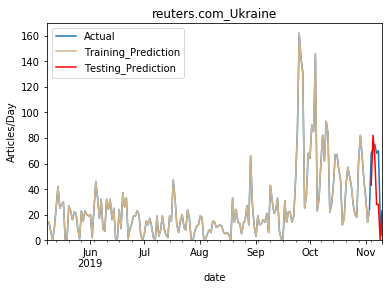

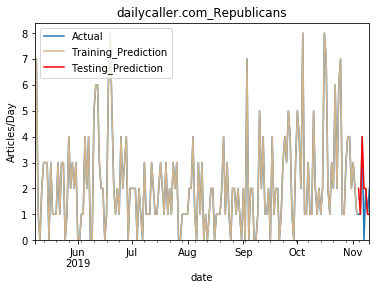

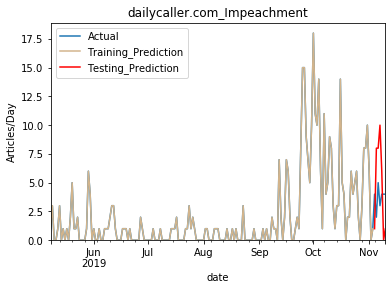

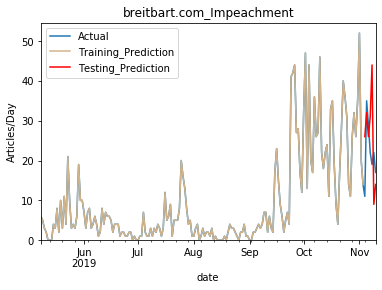

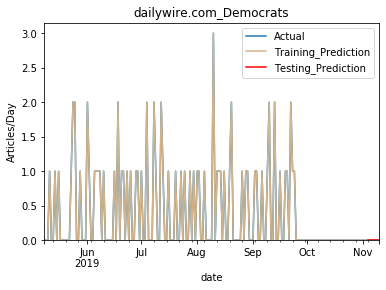

...

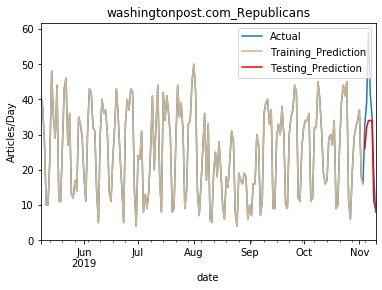

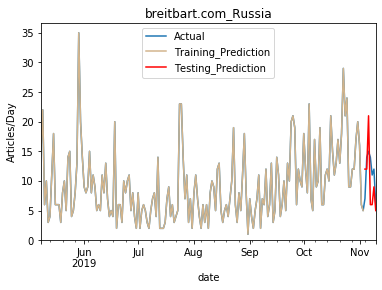

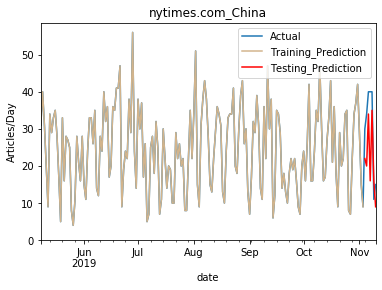

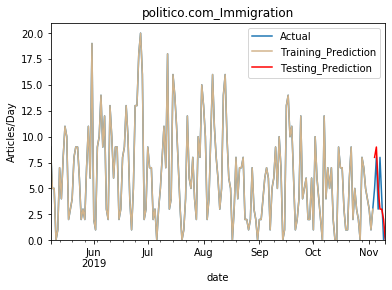

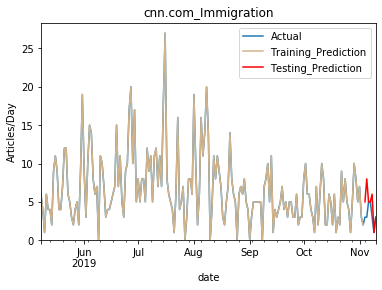

In [87]:
import matplotlib.pyplot as plt

os.makedirs("imgs_6mo_dt", exist_ok=True)
idx = 0
for topic in r.Topic.unique():
  ax = r[r.Topic==topic]["Articles"].plot(title="Topic: {}".format(topic), ylim=0, label="Actual")

  r[r.Topic==topic]["p"][:-(test_days)].plot(title="{}".format(topic), ax=ax, ylim=0, color="tan", label="Training_Prediction")
  r[r.Topic==topic]["p"][-test_days:].plot(title="{}".format(topic), ax=ax, ylim=0, color="red", label="Testing_Prediction")
  
  idx +=1

  ax.set_ylabel("Articles/Day")

  ax.legend()
  #save images; you probably don't want to
  if True:
    plt.savefig('imgs_6mo_dt/{}.png'.format(topic.replace(".", "_")), bbox_inches='tight')
  plt.show()
